# Appliance Energy Consumption Dataset
Demonstrate exploratory data analysis on energy consumption dataset.  Dataset can be found on UCI Machine Learning Repository:

https://archive.ics.uci.edu/ml/datasets/Appliances+energy+prediction

Link to paper:

https://www.sciencedirect.com/science/article/pii/S0378778816308970?casa_token=DEpJL6Kpbi4AAAAA:5mshpNdXSRXvZwuINvEU-DBVSC1aBli-Xluc2vTsWondy7dWfa-lRxfDIFGHm1sqeAnwvn3powo

## Import Modules

In [1]:
# general
import pandas as pd
import numpy as np

# plotting
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns


## Load Data

In [2]:
data = pd.read_csv('energydata_complete.csv')
data.head(10)

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.20,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.500000,92.000000,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.20,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.600000,92.000000,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.20,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.700000,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.20,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.800000,92.000000,6.000000,51.500000,5.000000,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.20,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.900000,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097
5,2016-01-11 17:50:00,50,40,19.890000,46.026667,19.20,44.500000,19.79,44.933333,18.890000,...,17.000000,45.29,6.016667,734.000000,92.000000,5.333333,43.833333,4.800000,44.919484,44.919484
6,2016-01-11 18:00:00,60,50,19.890000,45.766667,19.20,44.500000,19.79,44.900000,18.890000,...,17.000000,45.29,5.900000,734.100000,92.000000,5.000000,40.000000,4.700000,47.233763,47.233763
7,2016-01-11 18:10:00,60,50,19.856667,45.560000,19.20,44.500000,19.73,44.900000,18.890000,...,17.000000,45.29,5.916667,734.166667,91.833333,5.166667,40.000000,4.683333,33.039890,33.039890
8,2016-01-11 18:20:00,60,40,19.790000,45.597500,19.20,44.433333,19.73,44.790000,18.890000,...,17.000000,45.29,5.933333,734.233333,91.666667,5.333333,40.000000,4.666667,31.455702,31.455702
9,2016-01-11 18:30:00,70,40,19.856667,46.090000,19.23,44.400000,19.79,44.863333,18.890000,...,17.000000,45.29,5.950000,734.300000,91.500000,5.500000,40.000000,4.650000,3.089314,3.089314


In [3]:
print('Number of features: ', data.shape[1])
print('Number of observations: ', data.shape[0])

Number of features:  29
Number of observations:  19735


Print column names

In [4]:
print(data.columns)

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')


Create lists of variable names

In [5]:
energy = ['Appliances', 'lights']
temp = ['T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7', 'T8', 'T9']
rh = ['RH_1', 'RH_2', 'RH_3', 'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9']
weather = ['T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint']
rv = ['rv1', 'rv2']

In [6]:
data[energy].describe()

,Appliances,lights
count,19735.000000,19735.000000
mean,97.694958,3.801875
std,102.524891,7.935988
min,10.000000,0.000000
25%,50.000000,0.000000
50%,60.000000,0.000000
75%,100.000000,0.000000
max,1080.000000,70.000000


In [7]:
data[temp].describe()

,T1,T2,T3,T4,T5,T6,T7,T8,T9
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,21.686571,20.341219,22.267611,20.855335,19.592106,7.910939,20.267106,22.029107,19.485828
std,1.606066,2.192974,2.006111,2.042884,1.844623,6.090347,2.109993,1.956162,2.014712
min,16.790000,16.100000,17.200000,15.100000,15.330000,-6.065000,15.390000,16.306667,14.890000
25%,20.760000,18.790000,20.790000,19.530000,18.277500,3.626667,18.700000,20.790000,18.000000
50%,21.600000,20.000000,22.100000,20.666667,19.390000,7.300000,20.033333,22.100000,19.390000
75%,22.600000,21.500000,23.290000,22.100000,20.619643,11.256000,21.600000,23.390000,20.600000
max,26.260000,29.856667,29.236000,26.200000,25.795000,28.290000,26.000000,27.230000,24.500000


In [8]:
data[rh].describe()

,RH_1,RH_2,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,40.259739,40.420420,39.242500,39.026904,50.949283,54.609083,35.388200,42.936165,41.552401
std,3.979299,4.069813,3.254576,4.341321,9.022034,31.149806,5.114208,5.224361,4.151497
min,27.023333,20.463333,28.766667,27.660000,29.815000,1.000000,23.200000,29.600000,29.166667
25%,37.333333,37.900000,36.900000,35.530000,45.400000,30.025000,31.500000,39.066667,38.500000
50%,39.656667,40.500000,38.530000,38.400000,49.090000,55.290000,34.863333,42.375000,40.900000
75%,43.066667,43.260000,41.760000,42.156667,53.663333,83.226667,39.000000,46.536000,44.338095
max,63.360000,56.026667,50.163333,51.090000,96.321667,99.900000,51.400000,58.780000,53.326667


In [9]:
data[weather].describe()

,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707
std,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648
min,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000
25%,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000
50%,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333
75%,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667
max,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000


In [10]:
data[rv].describe()

,rv1,rv2
count,19735.000000,19735.000000
mean,24.988033,24.988033
std,14.496634,14.496634
min,0.005322,0.005322
25%,12.497889,12.497889
50%,24.897653,24.897653
75%,37.583769,37.583769
max,49.996530,49.996530


## Plot Data

In [11]:
def plot_time_fun(data, features, plot_title):
    fig, ax = plt.subplots(figsize=(12,6))
    for f in features:
        ax.plot(mdates.date2num(data['date']), data[f], label=f)

    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.set_xlabel('Date')
    ax.set_ylabel('Measurement')
    ax.set_title(plot_title)
    ax.legend()

Plot energy over time

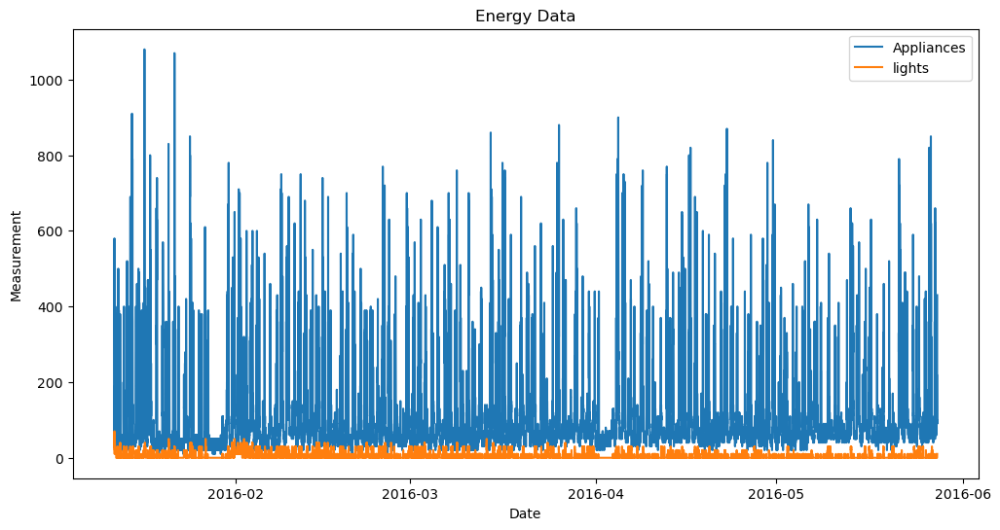

In [12]:
plot_time_fun(data, energy, 'Energy Data')

Temperature over time

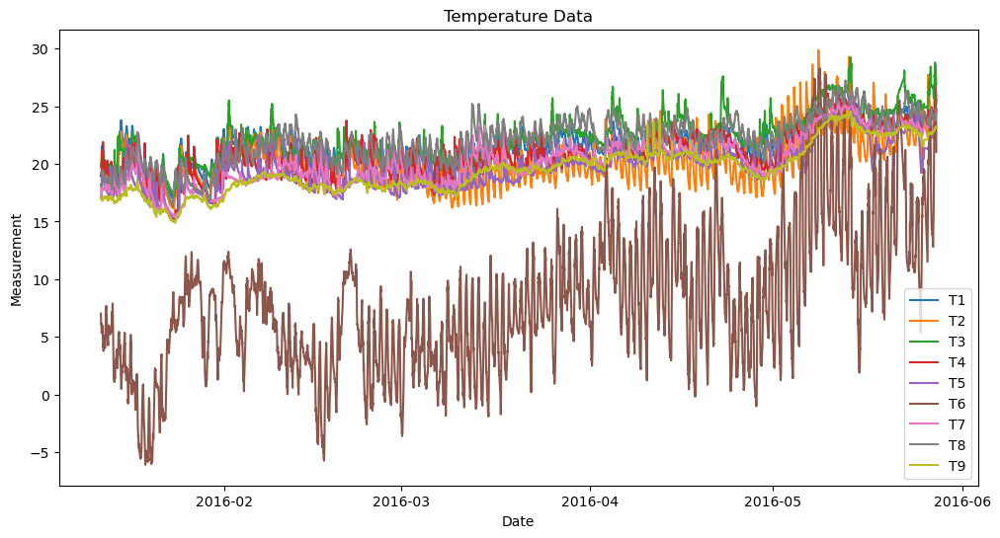

In [13]:
plot_time_fun(data, temp, 'Temperature Data')

Relative humidity over time

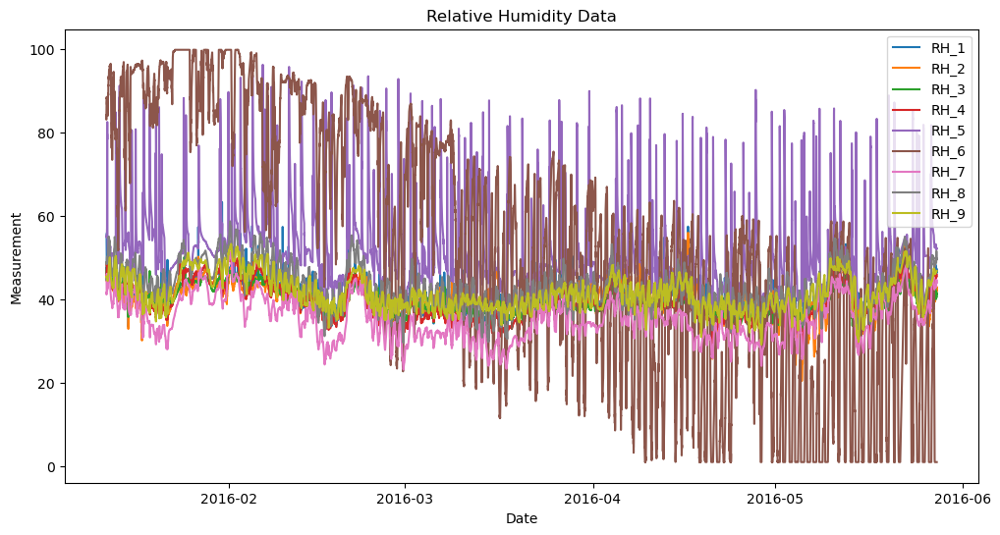

In [14]:
plot_time_fun(data, rh, 'Relative Humidity Data')

Weather over time

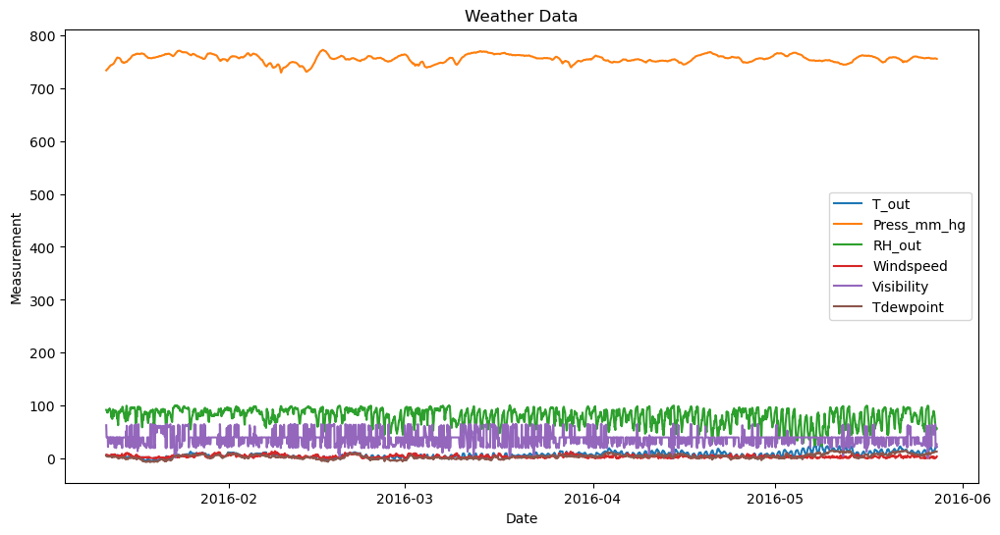

In [15]:
plot_time_fun(data, weather, 'Weather Data')

Random variable over time

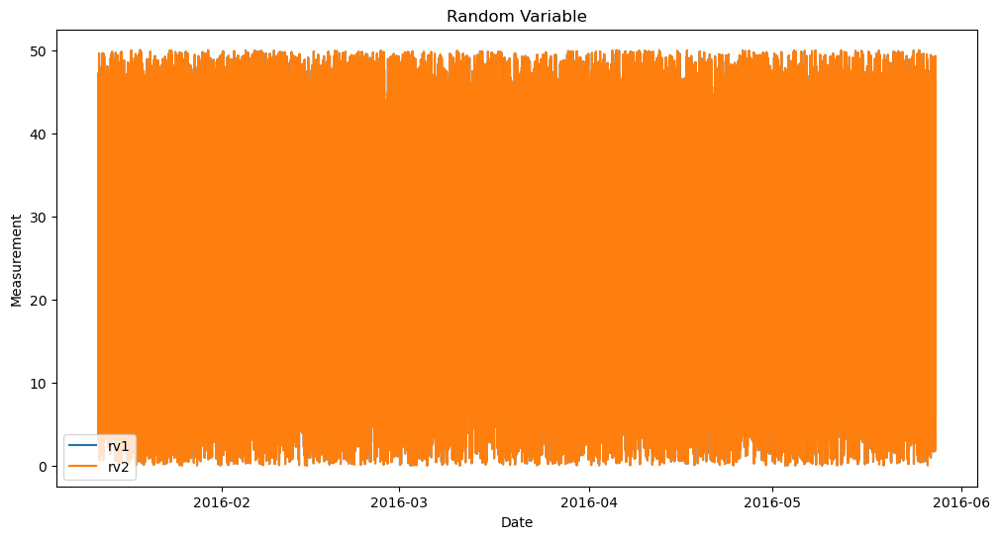

In [16]:
plot_time_fun(data, rv, 'Random Variable')

## Distributions

In [17]:
def distribution_plot(data, features):
    for f in features:
        fig, ax = plt.subplots(figsize=(10,5))
        ax.hist(data[f], bins=20)
        ax.set_xlabel('Measurement')
        ax.set_ylabel('Count')
        ax.set_title(f)

Energy Distributions

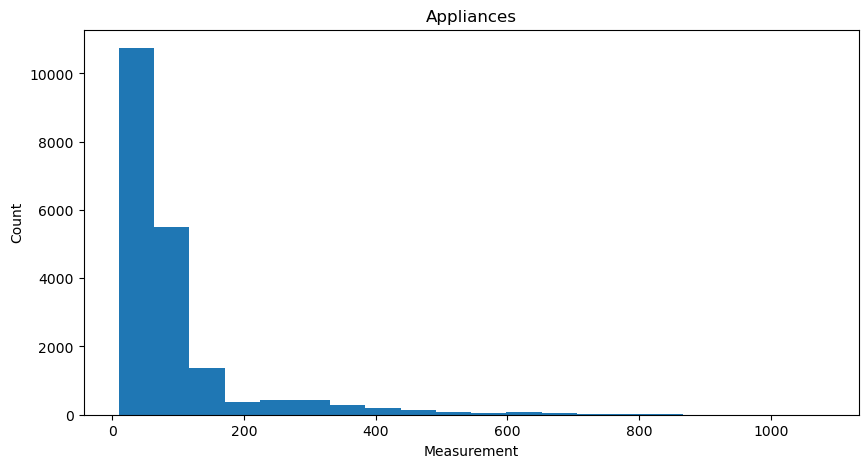

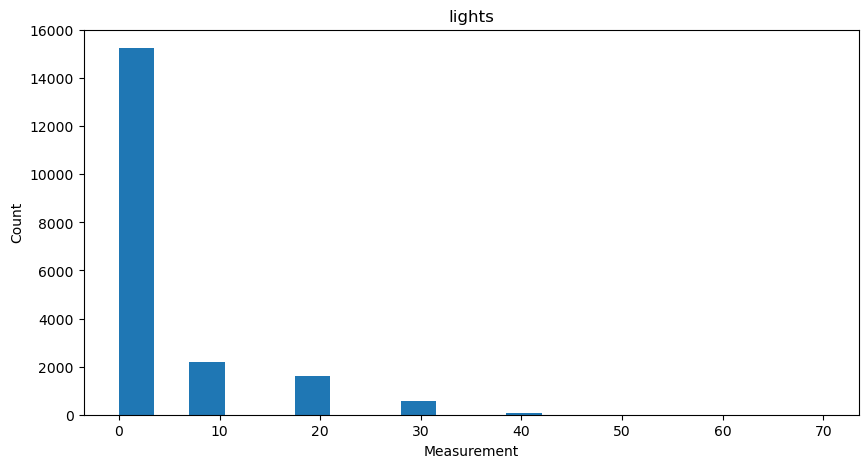

In [18]:
distribution_plot(data, energy)

Temperature Distributions

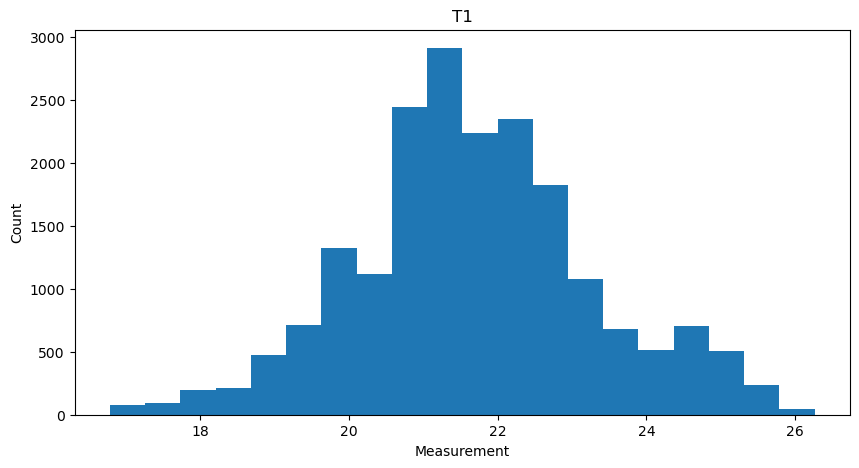

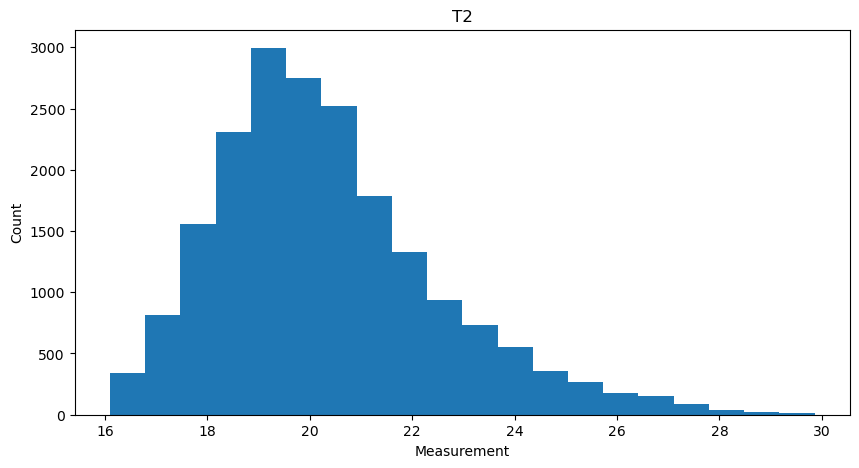

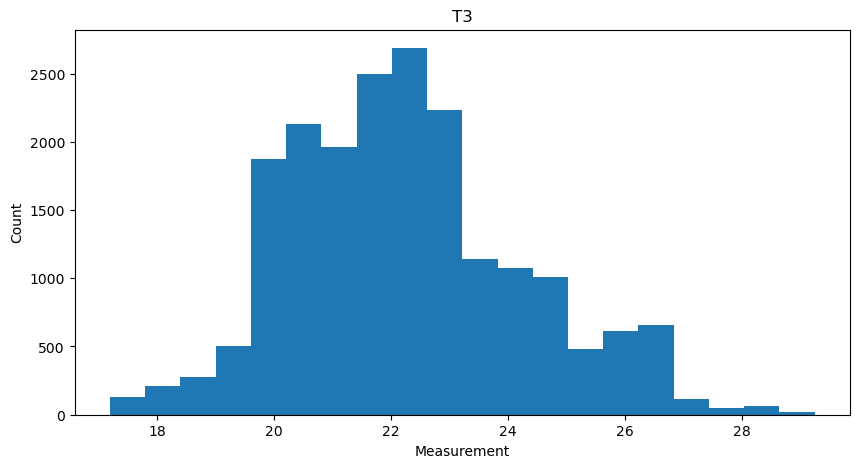

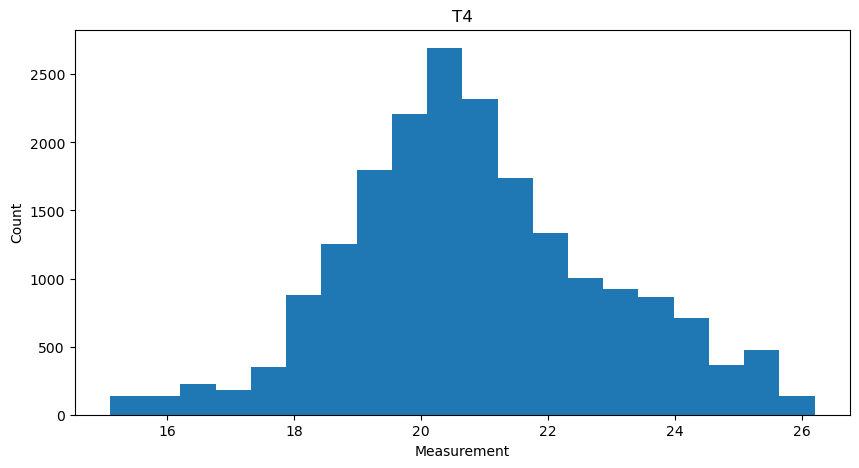

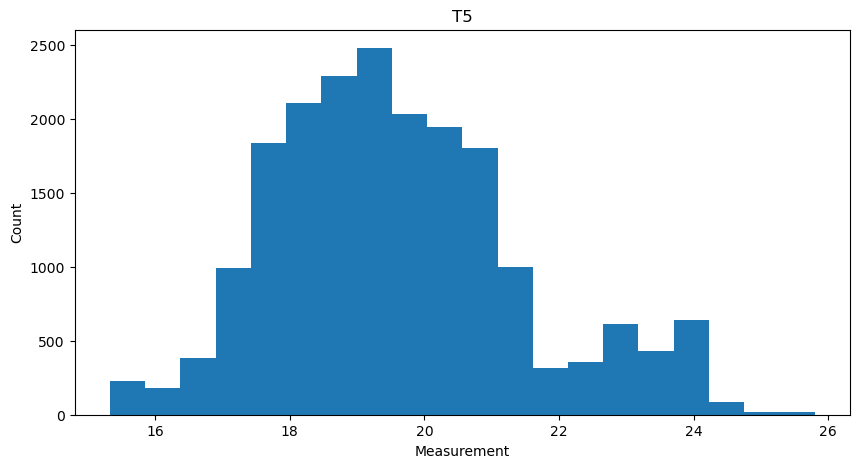

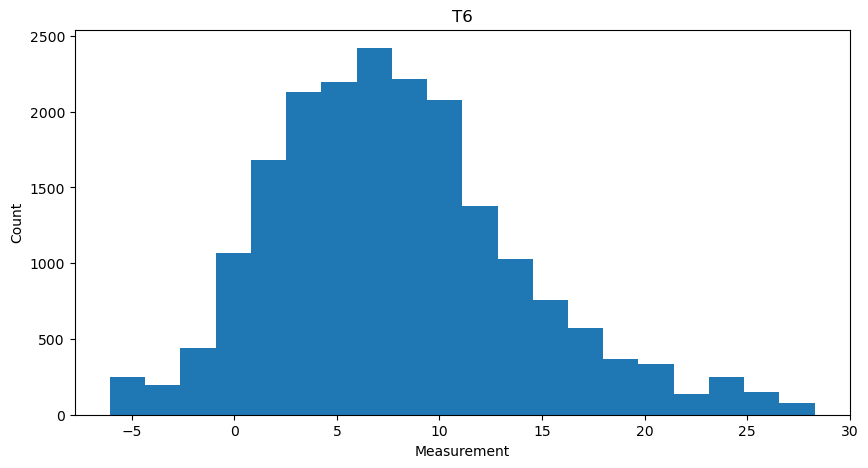

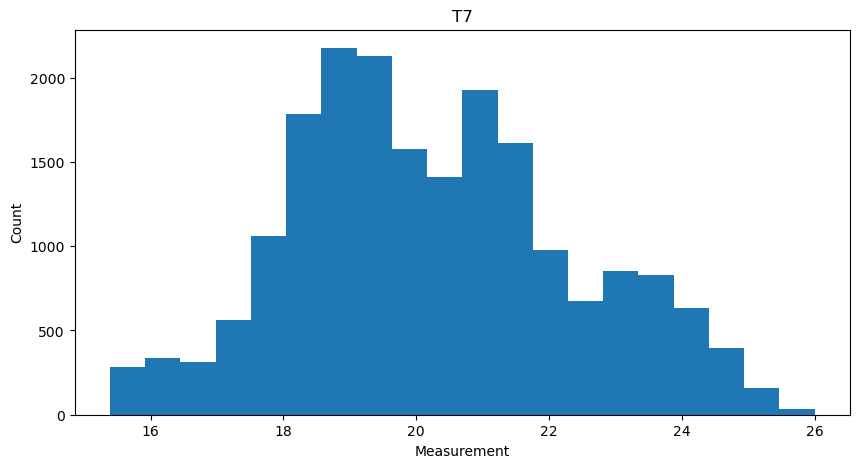

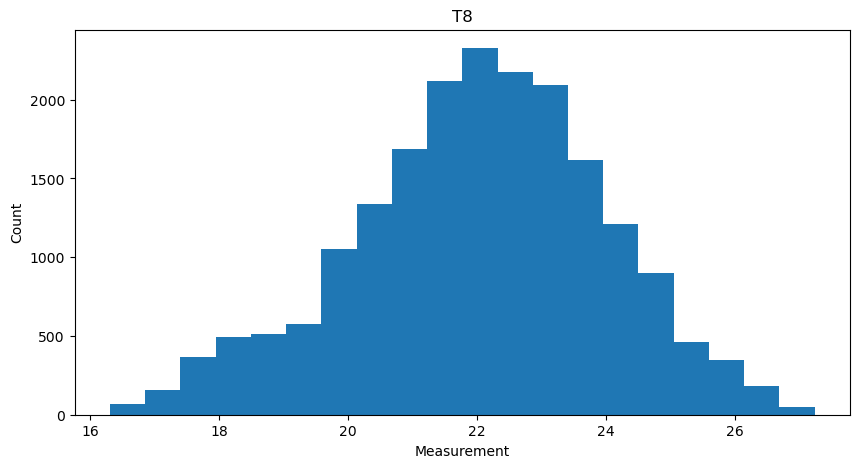

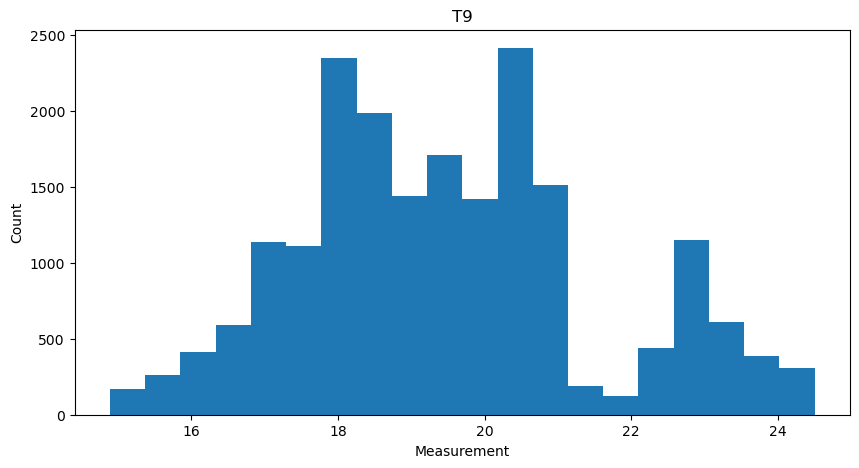

In [19]:
distribution_plot(data, temp)

Relative humidity distributions

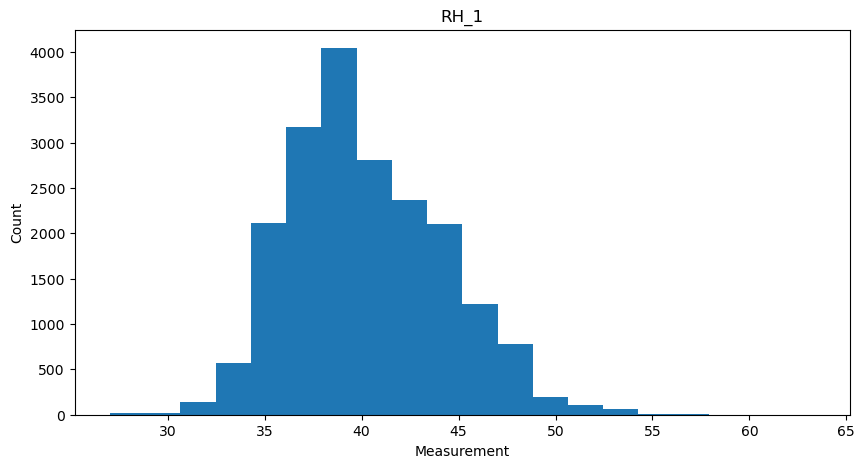

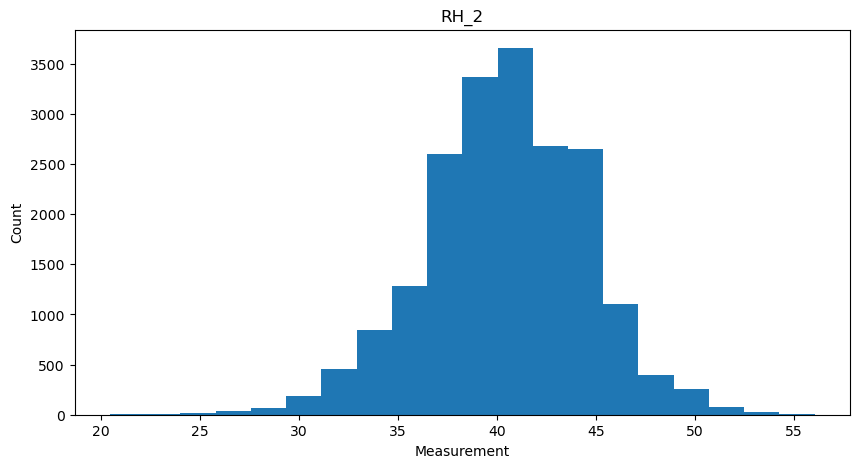

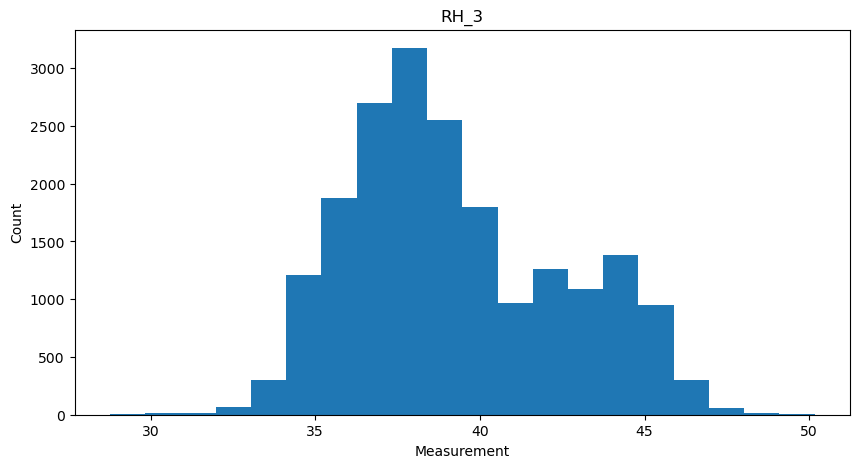

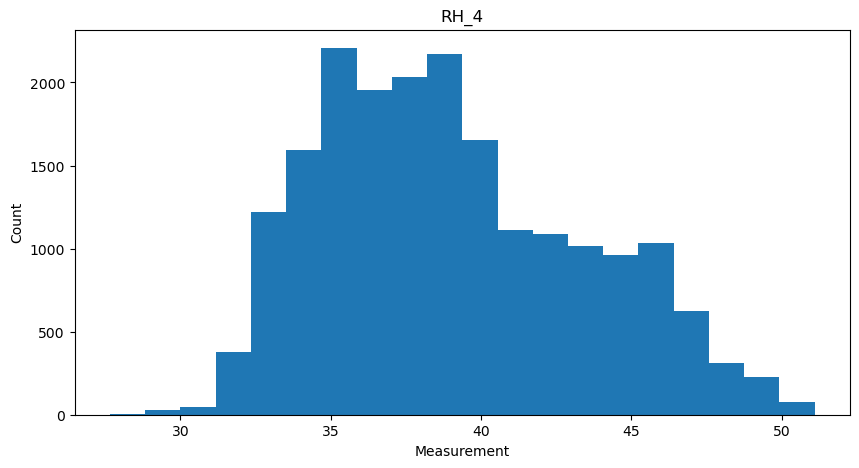

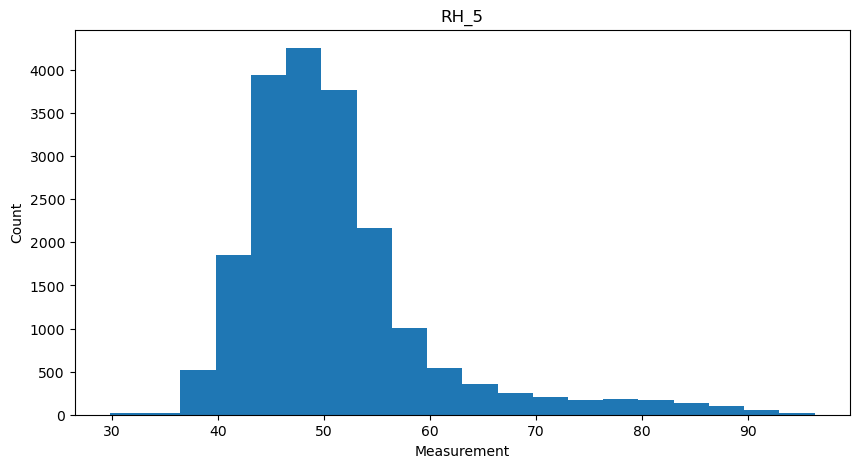

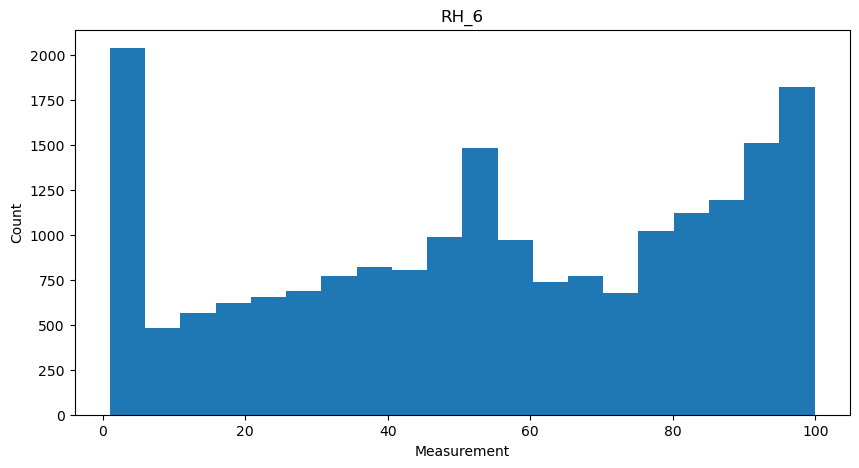

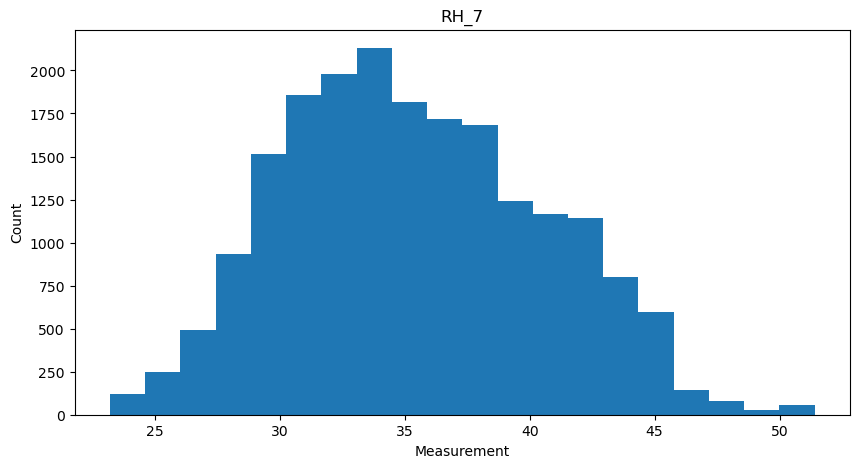

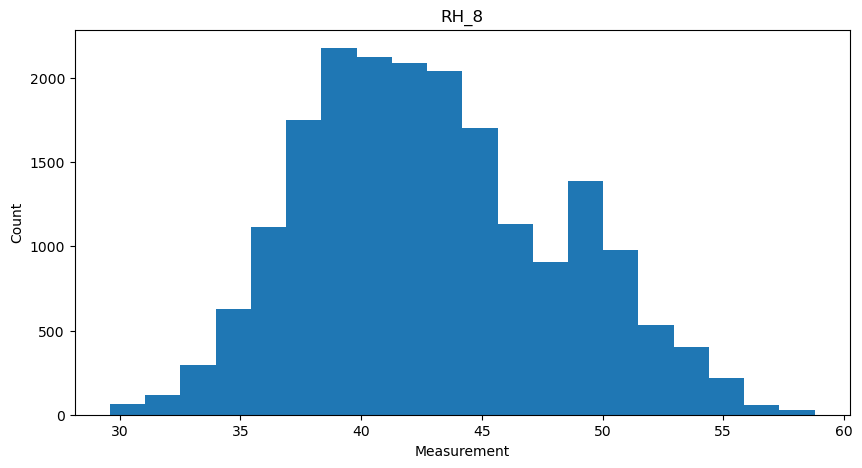

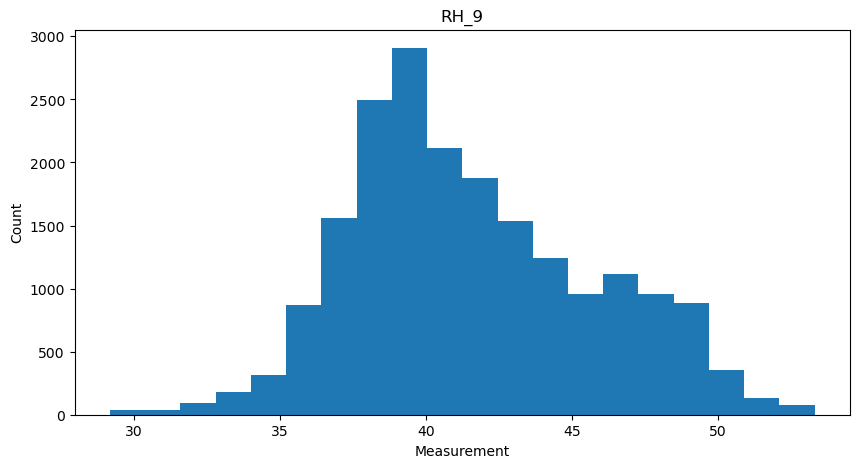

In [20]:
distribution_plot(data, rh)

Weather distributions

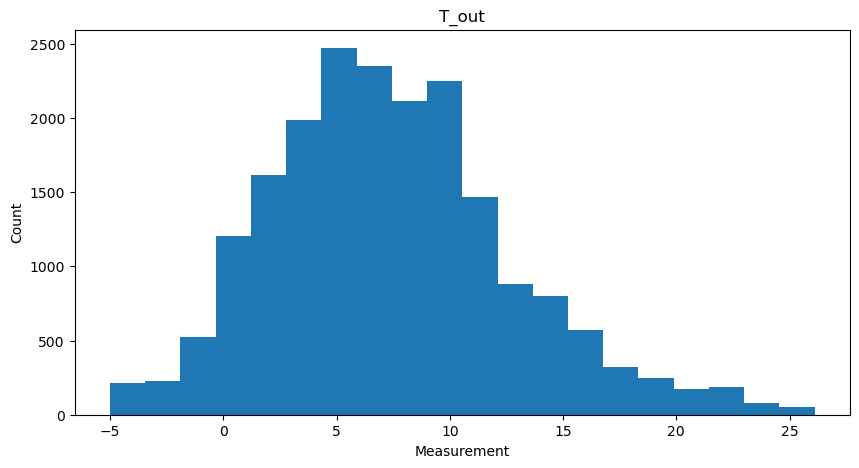

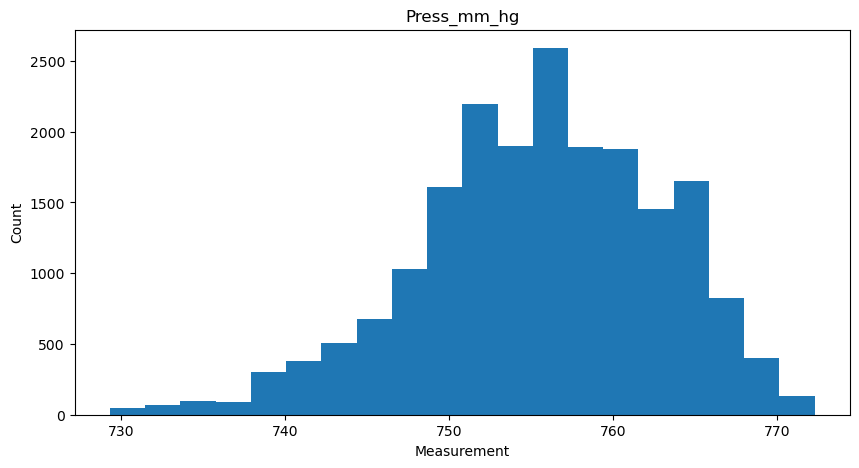

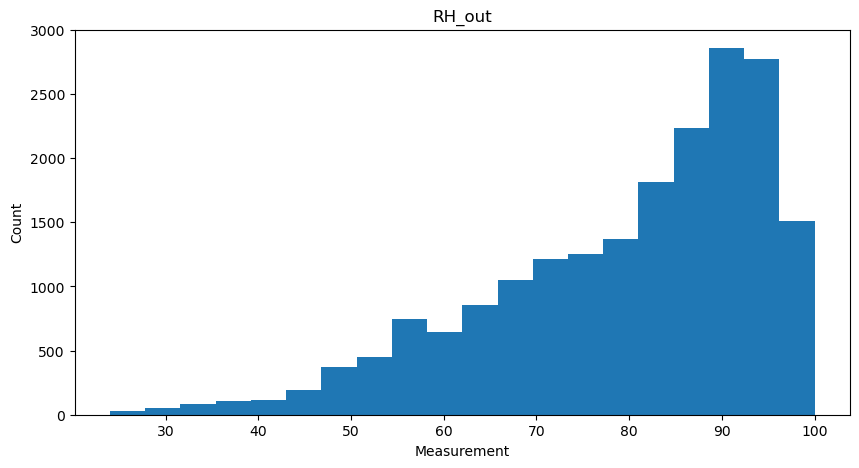

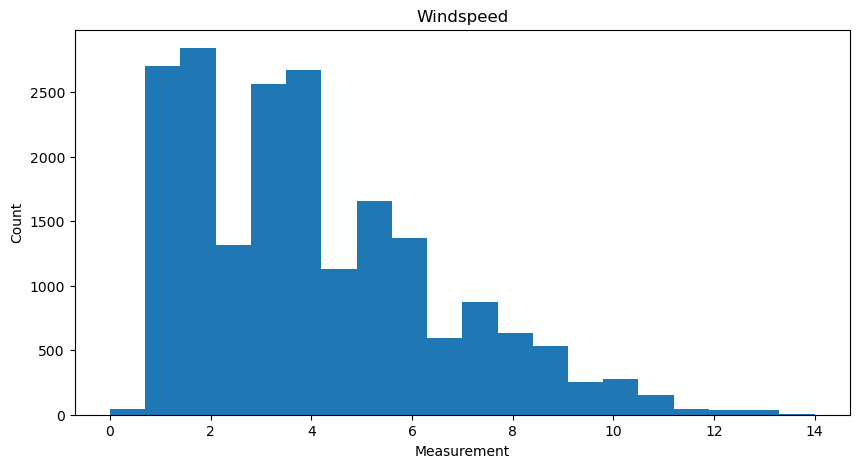

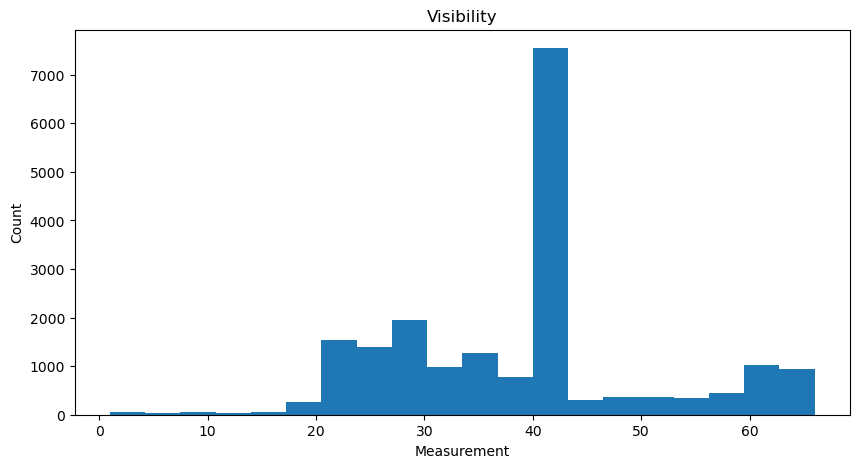

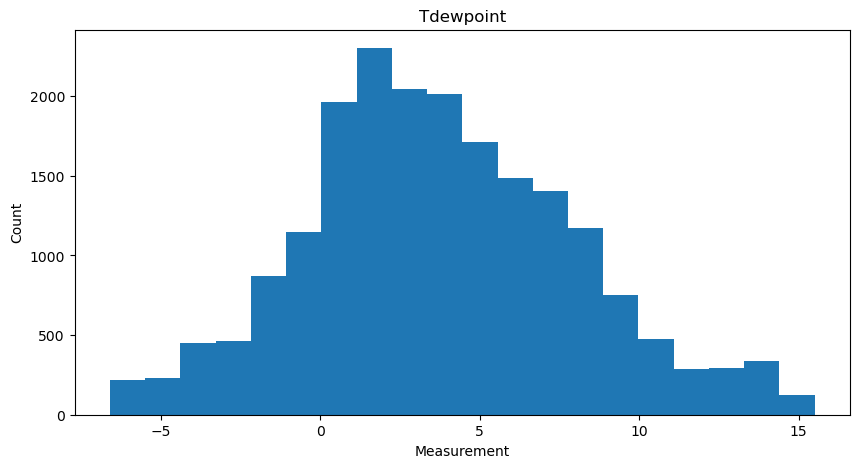

In [21]:
distribution_plot(data, weather)

Random variable distributions

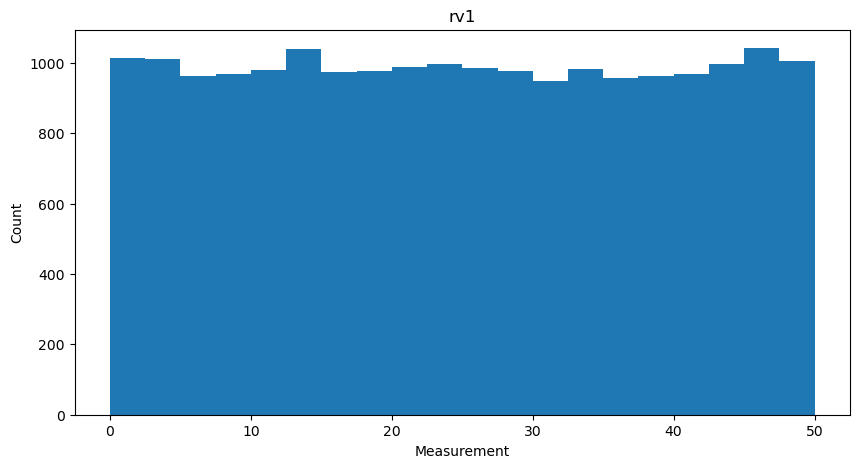

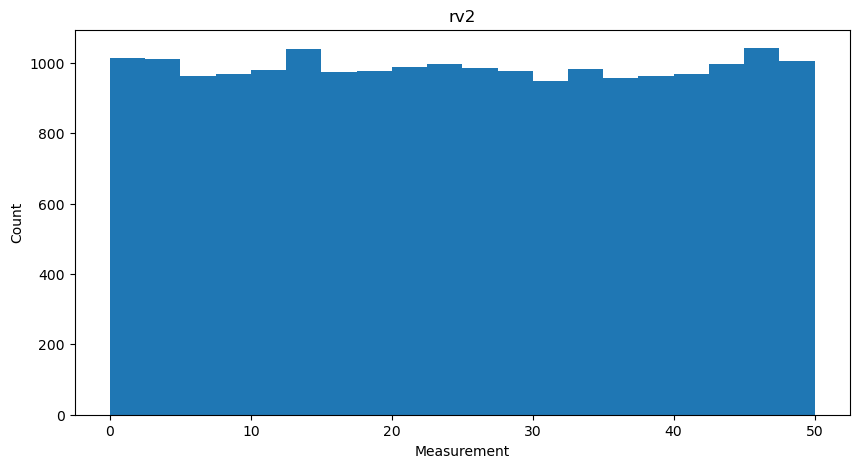

In [22]:
distribution_plot(data, rv)

## Pair Plots

Energy correlation

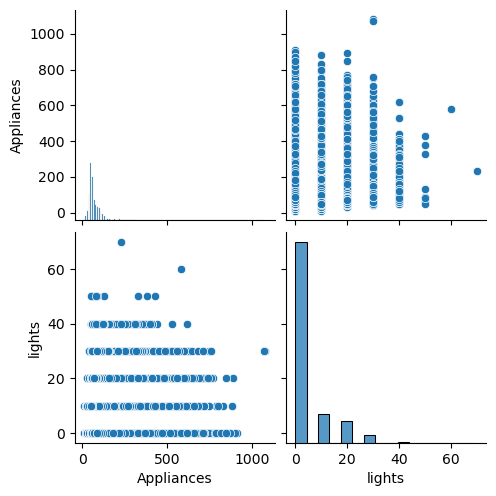

In [23]:
sns.pairplot(data[energy])

Temperature pair plots

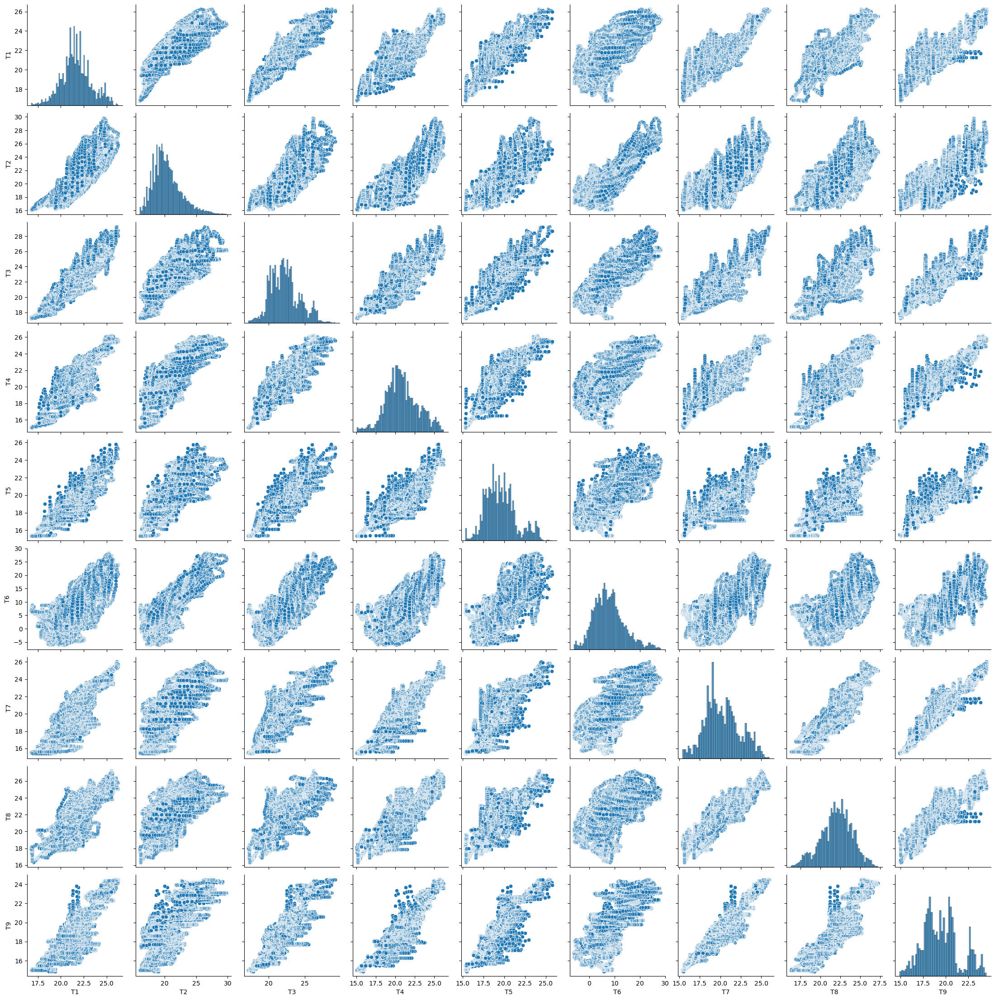

In [24]:
sns.pairplot(data[temp])

Relative humidity pair plots

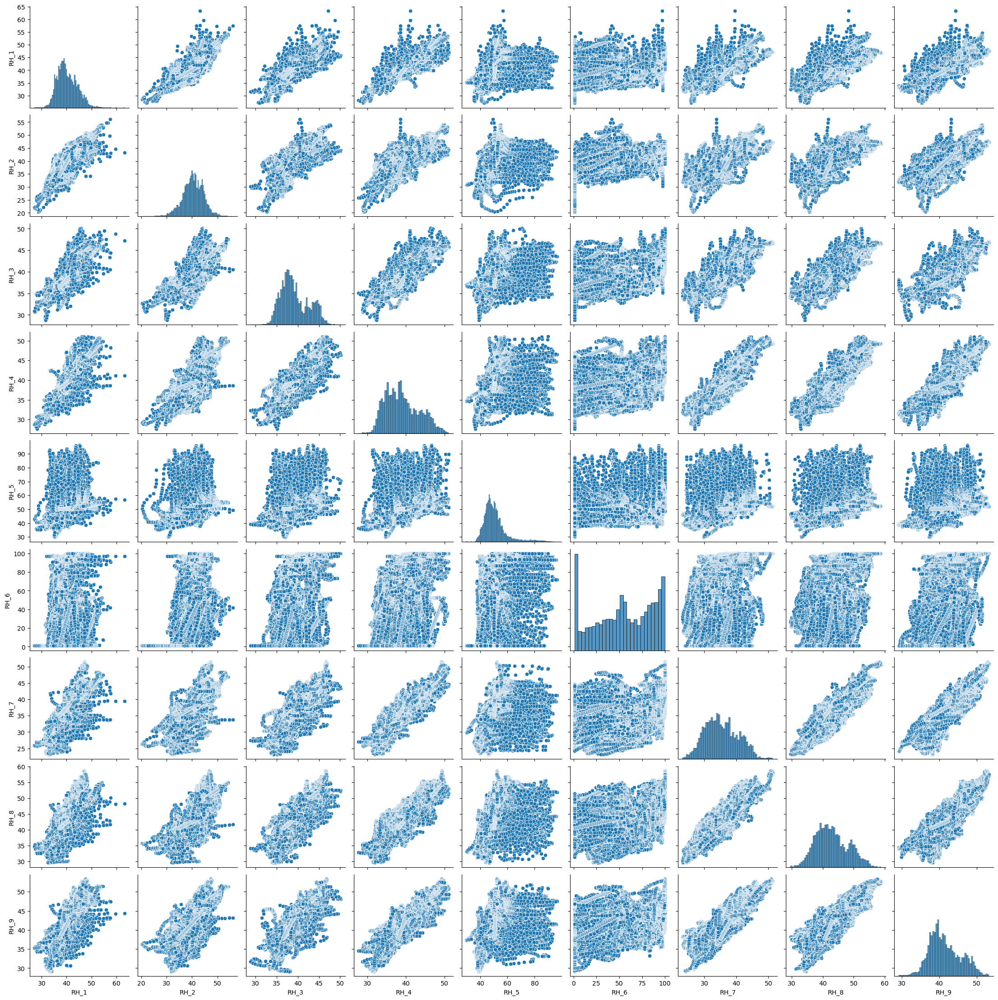

In [25]:
sns.pairplot(data[rh])

Weather pair plots

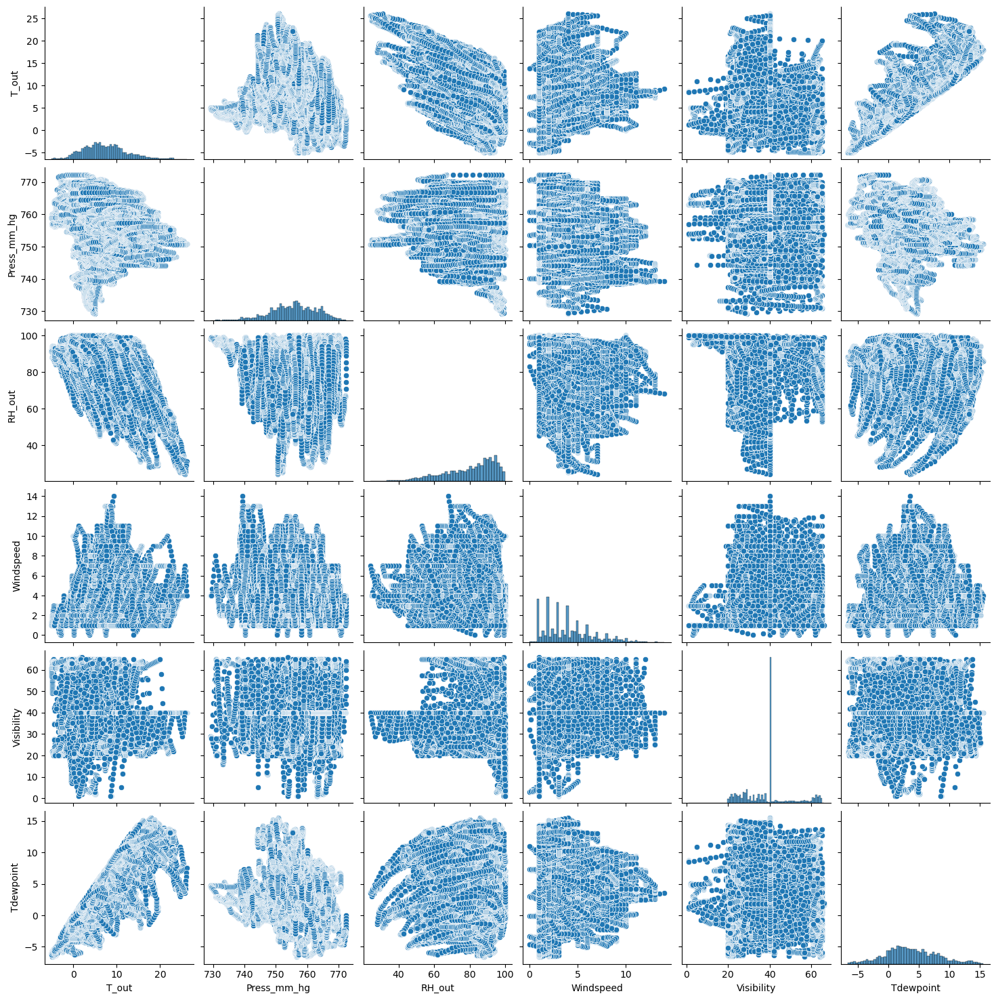

In [26]:
sns.pairplot(data[weather])

Random variable pair plots

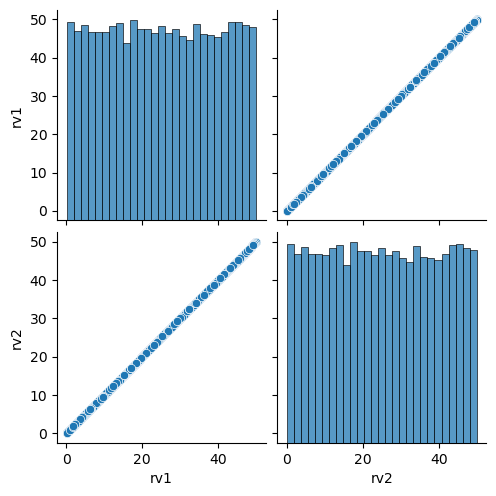

In [27]:
sns.pairplot(data[rv])

## Correlation

Energy data

<Axes: >

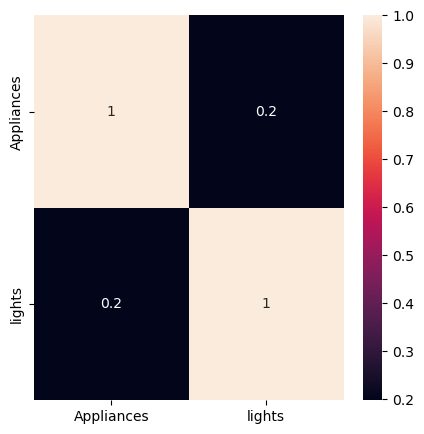

In [28]:
fig, ax = plt.subplots(figsize=(5,5))
sns.heatmap(data[energy].corr(), annot=True, ax=ax)

Correlation between appliances and temperature

<Axes: >

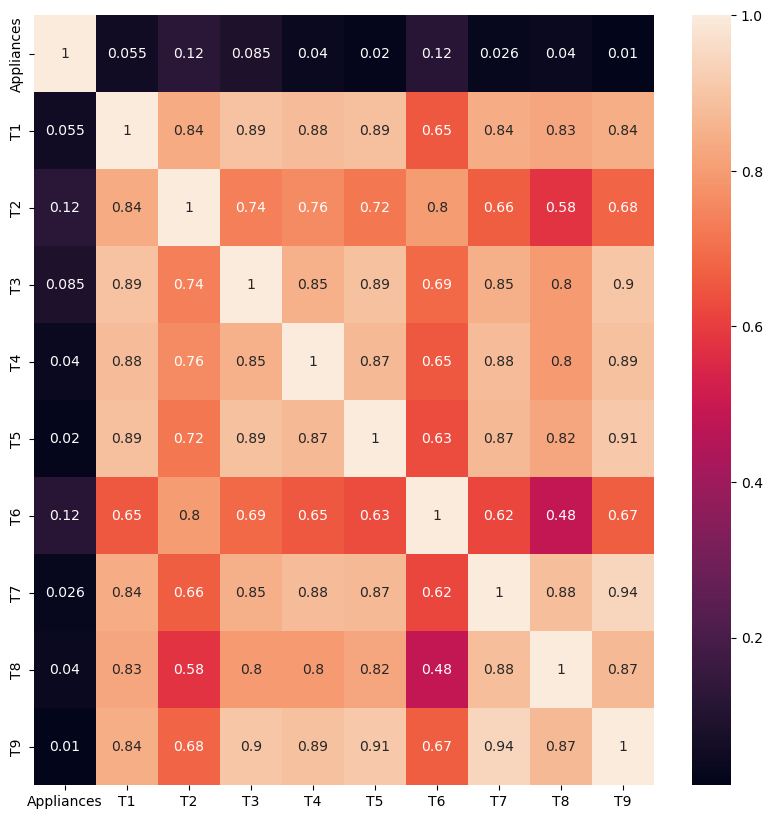

In [29]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(data[['Appliances'] + temp].corr(), annot=True, ax=ax)

Correlation between appliances and relative humidity

<Axes: >

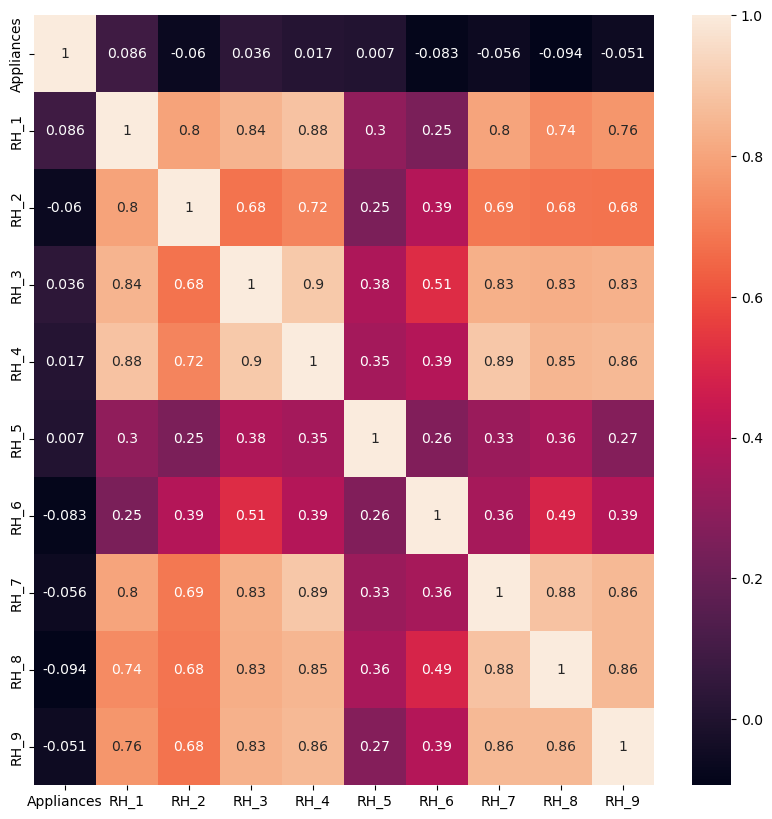

In [30]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(data[['Appliances'] + rh].corr(), annot=True, ax=ax)

Correlation between appliances and weather

<Axes: >

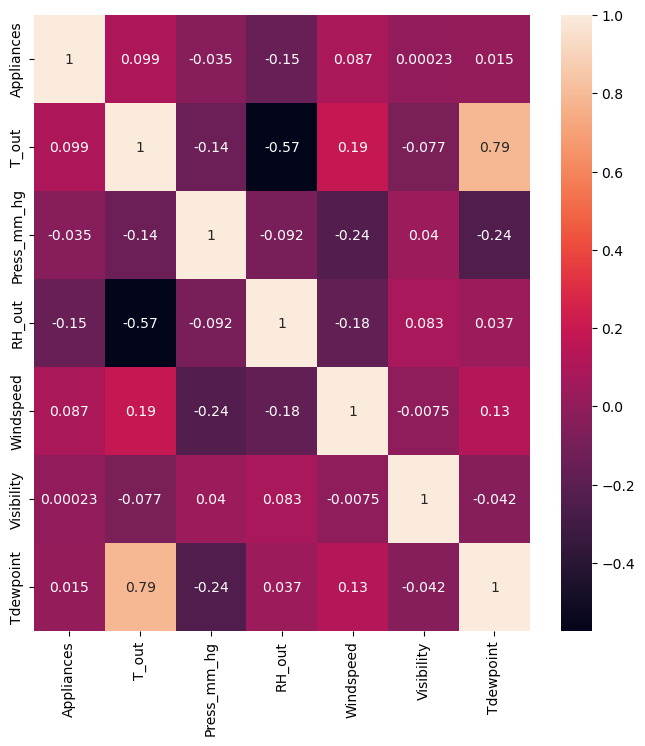

In [31]:
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(data[['Appliances'] + weather].corr(), annot=True, ax=ax)

Correlation between appliances and random variables

<Axes: >

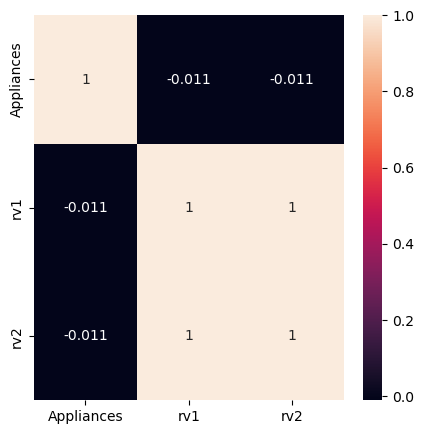

In [32]:
fig, ax = plt.subplots(figsize=(5,5))
sns.heatmap(data[['Appliances'] + rv].corr(), annot=True, ax=ax)